In [106]:
from IPython.display import HTML
from IPython.display import Image
import warnings
warnings.filterwarnings("ignore")

This is your chance to wow us with creative and rigorous solutions! Please include your code at the end of your submission, or in a separate file. We also accept incomplete solutions.

In [75]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }

  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

Part 1 : Exploratory data analysis
==================

The attached logins.json file contains (simulated) timestamps of user logins in a particular geographic location. Aggregate these login counts based on 15 minute time intervals, and visualize and describe the resulting time series of login counts in ways that best characterize the underlying patterns of the demand. Please report/illustrate important features of the demand, such as daily cycles. If there are data quality issues, please report them.

Data description
-------

    ● city: city this user signed up in
    ● phone: primary device for this user
    ● signup_date: date of account registration; in the form ‘YYYY MM DD’
    ● last_trip_date: the last time this user completed a trip; in the form ‘YYYY MM DD’
    ● avg_dist: the average distance in miles per trip taken in the first 30 days after signup
    ● avg_rating_by_driver: the rider’s average rating over all of their trips
    ● avg_rating_of_driver: the rider’s average rating of their drivers over all of their trips
    ● surge_pct: the percent of trips taken with surge multiplier > 1
    ● avg_surge: The average surge multiplier over all of this user’s trips
    ● trips_in_first_30_days: the number of trips this user took in the first 30 days aftersigning up
    ● ultimate_black_user: TRUE if the user took an Ultimate Black in their first 30 days; FALSE otherwise
    ● weekday_pct: the percent of the user’s trips occurring during a weekday

In [256]:
import pandas as pd
import numpy as np
import scipy.stats

import statsmodels.api as sm
import json
import time
from datetime import date
import datetime as dt

import plotly
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

from IPython.display import display, Math, Latex

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [196]:
logins_data=pd.read_json('logins.json')

In [197]:
logins_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93142 entries, 0 to 93141
Data columns (total 1 columns):
login_time    93142 non-null datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 727.8 KB


In [198]:
logins_data.describe()

,login_time
count,93142
unique,92265
top,1970-02-12 11:16:53
freq,3
first,1970-01-01 20:12:16
last,1970-04-13 18:57:38


In [199]:
logins_data.head()

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [213]:
logins_data.sort_values(by='login_time',inplace=True)

In [215]:
logins_data.iloc[0].datetime

login_time   1970-01-01 20:12:16
Name: 6, dtype: datetime64[ns]

In [233]:
logins_data.sort_values(by='login_time').head(3)

,login_time
6,1970-01-01 20:12:16
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10


In [234]:
logins_data.sort_values(by='login_time').tail(3)

,login_time
93139,1970-04-13 18:54:02
93141,1970-04-13 18:54:23
93140,1970-04-13 18:57:38


In [226]:
print('Number of Duplicate Records:',len(logins_data[logins_data.duplicated(keep='first')]))

Number of Duplicate Records: 877


**Explanation**: We can see that the dataset has 93142 records and the first login starts on January, 1st 1970 at 8:12 pm and ending on April, 13 at 6:57 pm. Of the 93142 non-null login entries there are 92265 unique login entries and 877 duplicates (or logins at exact same time). Without knowledge about whether or not the duplicates are valid data, I am tempted to drop them but keep in mind that they may impact the results. The 877 duplicates represent 877/93142 (.9%) of the dataset.

In [230]:
logins_data=logins_data[~logins_data.duplicated(keep='first')]

In [235]:
plot_df=pd.DataFrame(logins_data['login_time'].value_counts().resample('15T').sum()).reset_index()
plot_df.columns=['login_time','login_counts']

In [236]:
fig = go.Figure([go.Scatter(x=plot_df['login_time'], y=plot_df['login_counts'])])

fig.update_layout(title=go.layout.Title(text="Login Activity",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Time in 15 Minute Units",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Login Counts",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

**Explanation:** After aggregating activity within 15 minute intervals. We can see there is a regular rhythm with the data that isn't entirely clear; there definitely seems to be monthly spikes in login activity.

In [239]:
s = sm.tsa.seasonal_decompose(logins['login_time'].value_counts().resample('12H').sum())
decomposed=pd.DataFrame(s.observed)
decomposed.columns=['observed']
decomposed['seasonal']=np.array(s.seasonal)
decomposed['trend']=np.array(s.trend)
decomposed['residual']=np.array(s.resid)
decomposed.reset_index(inplace=True)
decomposed.head(25)

,index,observed,seasonal,trend,residual
0,1970-01-01 12:00:00,112,4.993397,NaN,NaN
1,1970-01-02 00:00:00,291,-34.636068,NaN,NaN
2,1970-01-02 12:00:00,390,38.727028,NaN,NaN
3,1970-01-03 00:00:00,402,-10.874163,NaN,NaN
4,1970-01-03 12:00:00,391,57.557385,NaN,NaN
5,1970-01-04 00:00:00,513,66.825242,NaN,NaN
6,1970-01-04 12:00:00,275,18.340123,NaN,NaN
7,1970-01-05 00:00:00,205,-29.174758,NaN,NaN
8,1970-01-05 12:00:00,254,60.099051,NaN,NaN
9,1970-01-06 00:00:00,198,-0.094401,NaN,NaN


In [240]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['observed'], name="Observed",line_color='#1f77b4'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['seasonal'], name="Seasonal",line_color='#ff7f0e'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['trend'], name="Trend",line_color='#d62728'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['residual'], name="Residual",line_color='#2ca02c'))
fig.update_layout(title_text='Time 12-Hour Series Decomposition',xaxis_rangeslider_visible=True)
fig.show()

**Explanation:** After decomposing the timeline data we can see there seems to be a slight increase in trend for the login activity, but not a particularly dramatic increase in the 4 months. We can definitely see the monthly spikes and mid-monthly spikes in activity as well. There also appear to be no long-term seasonal effects although that may be misleading because we are only looking at a quarter of a year. The trend may also be more pronounced later in the year.

In [237]:
s = sm.tsa.seasonal_decompose(logins['login_time'].value_counts().resample('24H').sum())
decomposed=pd.DataFrame(s.observed)
decomposed.columns=['observed']
decomposed['seasonal']=np.array(s.seasonal)
decomposed['trend']=np.array(s.trend)
decomposed['residual']=np.array(s.resid)
decomposed.reset_index(inplace=True)

In [238]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['observed'], name="Observed",line_color='#1f77b4'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['seasonal'], name="Seasonal",line_color='#ff7f0e'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['trend'], name="Trend",line_color='#d62728'))
fig.add_trace(go.Scatter(x=decomposed['index'], y=decomposed['residual'], name="Residual",line_color='#2ca02c'))
fig.update_layout(title_text='Time Series 24-Hour Decomposition',xaxis_rangeslider_visible=True)
fig.show()

**Explanation:** After decomposing the data into 24 hour chunks instead of 12 we can see the monthly and mid-monthly spikes far more pronounced.  The seasonality also seems to support the monthly spikes in activity as well.

In [248]:
plot_df=pd.DataFrame(logins['login_time'].value_counts().resample('15T').sum()).reset_index()
plot_df.columns=['login_time','login_counts']
plot_df['day']=plot_df['login_time'].dt.weekday_name
plot_df['hour']=plot_df['login_time'].dt.hour
plot_df['minute']=plot_df['login_time'].dt.minute
plot_df=plot_df.sort_values(by='login_time')
plot_df=plot_df.groupby(['day','hour','minute']).agg(['mean', 'count', 'std'])#.mean()
plot_df.reset_index(inplace=True)

In [249]:
day_hour_minute=plot_df[['day','hour','minute']]
day_hour_minute['hour']=day_hour_minute['hour'].apply(str)
day_hour_minute['minute']=day_hour_minute['minute'].apply(str)
hour_minute=list(zip(list(day_hour_minute['hour']),list(day_hour_minute['minute'])))
hour_minute=list(map(':'.join,hour_minute))
day_hour=list(zip(list(day_hour_minute['day']),list(day_hour_minute['hour'])))
day_hour=list(map(', '.join,day_hour))
day_hour_minute=list(zip(list(day_hour),list(day_hour_minute['minute'])))
day_hour_minute=list(map(':'.join,day_hour_minute))
plot_df['day_hour_minute']=day_hour_minute
plot_df['hour_minute']=hour_minute

In [250]:
plot_df.head(3)

day hour minute login_counts                 day_hour_minute hour_minute
                              mean count       std                            
0  Friday    0      0    15.800000    15  7.282072     Friday, 0:0         0:0
1  Friday    0     15    17.533333    15  5.139020    Friday, 0:15        0:15
2  Friday    0     30    15.466667    15  5.180550    Friday, 0:30        0:30

In [251]:
plot_df['day'].value_counts()

Friday       96
Wednesday    96
Sunday       96
Monday       96
Thursday     96
Saturday     96
Tuesday      96
Name: day, dtype: int64

**Explanation:** I have re-authored the dates and times into an easier to read format and returned means, counts, and standard deviations of the 15-minute login activity. We can see there is an equal number of days within the week throughout the dataset.  

In [254]:
monday=plot_df[plot_df['day']=='Monday'][['day_hour_minute','hour_minute','login_counts']]
tuesday=plot_df[plot_df['day']=='Tuesday'][['day_hour_minute','hour_minute','login_counts']]
wednesday=plot_df[plot_df['day']=='Wednesday'][['day_hour_minute','hour_minute','login_counts']]
thursday=plot_df[plot_df['day']=='Thursday'][['day_hour_minute','hour_minute','login_counts']]
friday=plot_df[plot_df['day']=='Friday'][['day_hour_minute','hour_minute','login_counts']]
saturday=plot_df[plot_df['day']=='Saturday'][['day_hour_minute','hour_minute','login_counts']]
sunday=plot_df[plot_df['day']=='Sunday'][['day_hour_minute','hour_minute','login_counts']]

In [255]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=monday['hour_minute'], y=monday['login_counts']['mean'], name="Monday",line_color='#1f77b4'))
fig.add_trace(go.Scatter(x=tuesday['hour_minute'], y=tuesday['login_counts']['mean'], name="Tuesday",line_color='#ff7f0e'))
fig.add_trace(go.Scatter(x=wednesday['hour_minute'], y=wednesday['login_counts']['mean'], name="Wednesday",line_color='#2ca02c'))
fig.add_trace(go.Scatter(x=thursday['hour_minute'], y=thursday['login_counts']['mean'], name="Thursday",line_color='#d62728'))
fig.add_trace(go.Scatter(x=friday['hour_minute'], y=friday['login_counts']['mean'], name="Friday",line_color='#9467bd'))
fig.add_trace(go.Scatter(x=saturday['hour_minute'], y=saturday['login_counts']['mean'], name="Saturday",line_color='#8c564b'))
fig.add_trace(go.Scatter(x=sunday['hour_minute'], y=sunday['login_counts']['mean'], name="Sunday",line_color='#e377c2'))
fig.update_layout(title_text='Average Login Activity During the Day',xaxis_rangeslider_visible=True),

fig.show()

**Explanation:** I have added average login activity throughout the week broken down by 15 minute time intervals plotted in a graph. You can adjust the range filter below the graph to investigate the differences in activity between specific days. The five day work week (Monday-Friday) seems to have fairly similar trends; the middle of the day seems to have more uniform activity compared to the beginning and end of the day. Friday in particular has an increase in login activity towards the end of the day. The weekends (Saturday & Sunday) have different activity where there is an increase in activity early in the day, then drops to very low activty with a slight increase towards the end of the day. I have broken down each weekly activity for each day in the graphs below in order to have a better understanding for each particular day.


In [60]:
lower_ci=monday['login_counts']['mean']-1.96*monday['login_counts']['std']/np.sqrt(monday['login_counts']['count'])
higher_ci=monday['login_counts']['mean']+1.96*monday['login_counts']['std']/np.sqrt(monday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=monday['day_hour_minute'], y=monday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=monday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=monday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Mondays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

In [61]:
lower_ci=tuesday['login_counts']['mean']-1.96*tuesday['login_counts']['std']/np.sqrt(tuesday['login_counts']['count'])
higher_ci=tuesday['login_counts']['mean']+1.96*tuesday['login_counts']['std']/np.sqrt(tuesday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=tuesday['day_hour_minute'], y=tuesday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=tuesday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=tuesday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Tuesdays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

**Explanation:** Above we can see quite a bit of variability on Tuesday activity, this variability in activity sets Tuesdays apart from the other days of the week; however, the estimate in general seems to follow the same rhythm in activity as other business days.

In [62]:
lower_ci=wednesday['login_counts']['mean']-1.96*wednesday['login_counts']['std']/np.sqrt(wednesday['login_counts']['count'])
higher_ci=wednesday['login_counts']['mean']+1.96*wednesday['login_counts']['std']/np.sqrt(wednesday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=wednesday['day_hour_minute'], y=wednesday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=wednesday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=wednesday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Wednesdays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

In [63]:
lower_ci=thursday['login_counts']['mean']-1.96*thursday['login_counts']['std']/np.sqrt(thursday['login_counts']['count'])
higher_ci=thursday['login_counts']['mean']+1.96*thursday['login_counts']['std']/np.sqrt(thursday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=thursday['day_hour_minute'], y=thursday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=thursday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=thursday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Thursdays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

In [64]:
lower_ci=friday['login_counts']['mean']-1.96*friday['login_counts']['std']/np.sqrt(friday['login_counts']['count'])
higher_ci=friday['login_counts']['mean']+1.96*friday['login_counts']['std']/np.sqrt(friday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=friday['day_hour_minute'], y=friday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=friday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=friday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Fridays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

In [65]:
lower_ci=saturday['login_counts']['mean']-1.96*saturday['login_counts']['std']/np.sqrt(saturday['login_counts']['count'])
higher_ci=saturday['login_counts']['mean']+1.96*saturday['login_counts']['std']/np.sqrt(saturday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=saturday['day_hour_minute'], y=saturday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=saturday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=saturday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Saturdays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

In [66]:
lower_ci=sunday['login_counts']['mean']-1.96*sunday['login_counts']['std']/np.sqrt(sunday['login_counts']['count'])
higher_ci=sunday['login_counts']['mean']+1.96*sunday['login_counts']['std']/np.sqrt(sunday['login_counts']['count'])

fig = go.Figure([go.Scatter(x=sunday['day_hour_minute'], y=sunday['login_counts']['mean'], name='Estimate',line_color='#d62728')])

fig.add_trace(go.Scatter(x=sunday['day_hour_minute'], y=lower_ci, name="Lower 95% Conf. Band",line_color='#7f7f7f'))
fig.add_trace(go.Scatter(x=sunday['day_hour_minute'], y=higher_ci, name="Upper 95% Conf. Band",line_color='#7f7f7f'))

fig.update_layout(title=go.layout.Title(text="Login Activity Among Sundays",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Every 15 minutes in the day",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Average Calls",
            font=dict(family="Courier New, monospace",size=18,color="#7f7f7f"))))

fig.show()

**Explanation:** Above we can see the Saturday/Sunday weekend activities broken down into 15-minute intervals. Both Saturday and Sunday behave in similar ways with a splurge in activity late/early in the morning then plummeting around breakfast time then increasing later in the day.

Part 2: Experiment and metrics design
======================================
The neighboring cities of Gotham and Metropolis have complementary circadian rhythms: on weekdays, Ultimate Gotham is most active at night, and Ultimate Metropolis is most active during the day. On weekends, there is reasonable activity in both cities.

However, a toll bridge, with a two way toll, between the two cities causes driver partners to tend to be exclusive to each city. The Ultimate managers of city operations for the two cities have proposed an experiment to encourage driver partners to be available in both cities, by reimbursing all toll costs.
1. What would you choose as the key measure of success of this experiment in encouraging driver partners to serve both cities, and why would you choose this metric?
2. Describe a practical experiment you would design to compare the effectiveness of the proposed change in relation to the key measure of success. 

In [261]:
print('If we fail to reject the null hypothesis then the data would seem consistent with the claim that the proportions of drivers of Gotham and Metropolis are equivalent. ')
Math(r'H_{0} : p_{before} - p_{after} = 0 \\ H_{1} : p_{before} - p_{after} \neq 0')

If we fail to reject the null hypothesis then the data would seem consistent with the claim that the proportions of drivers of Gotham and Metropolis are equivalent. 


<IPython.core.display.Math object>

In [262]:
Math(r'z: = \dfrac{(p_1 - p_2)}{\sqrt{\dfrac{p_1*(1-p_1)}{n_1} + \dfrac{p_2*(1-p_2)}{n_2} }}')

<IPython.core.display.Math object>

I think the easiest way would be to take the ratio of drivers for each condition before and after the implementation of the proposed experiment for some period of time.

*Before the experiment:*

    a. Gotham Night Drivers/ All Drivers / Period of time
    b. Gotham Day Drivers/ All Drivers / Period of time
    c. Metropolis Night Drivers/ All Drivers / Period of time
    d. Metropolis Day Drivers/ All Drivers / Period of time

*After the experiment:*

    e. Gotham Night Drivers/ All Drivers / Period of time
    f. Gotham Day Drivers/ All Drivers / Period of time
    g. Metropolis Night Drivers/ All Drivers / Period of time
    h. Metropolis Day Drivers/ All Drivers / Period of time


- After getting these proportions (before/after experiment) I would conduct a *z-test* to tell if there has been a statistically significant change in each of the proportions after the implementation of the experiment. In doing this, not only can we tell if the experiment had a marked change, but also the directionality *(and period of day)* of that change for each city. After conducting these tests, whether or not they were statistically significant, I would wait an additional period of time and then assess the rate of change and conduct another *z-test*. If the change were statistically significant and the rate of change was good I would be able to project/forecast the amount of time needed for drivers to be completely dispursed among both cities for night and day.

Part 3 : Predictive modeling
===========================
Ultimate is interested in predicting rider retention. To help explore this question, we have provided a sample dataset of a cohort of users who signed up for an Ultimate account in January 2014. The data was pulled several months later; we consider a user retained if they were “active” (i.e. took a trip) in the preceding 30 days. We would like you to use this data set to help understand what factors are the best predictorsfor retention, and offer suggestions to operationalize those insights to help Ultimate. The data is in the attached file ultimate_data_challenge.json. See below for a detailed description of the dataset. Please include any code you wrote for the analysis and delete the dataset when you have finished with the challenge.

1. Perform any cleaning, exploratory analysis, and/or visualizations to use the provided data for this analysis (a few sentences/plots describing your approach will suffice). What fraction of the observed users were retained?
2. Build a predictive model to help Ultimate determine whether or not a user will be activein their 6th month on the system. Discuss why you chose your approach, whatalternatives you considered, and any concerns you have. How valid is your model?Include any key indicators of model performance.
3. Briefly discuss how Ultimate might leverage the insights gained from the model toimprove its long term rider retention (again, a few sentences will suffice).

In [86]:
with open('ultimate_data_challenge.json') as challenge:
    ultimate_data = json.load(challenge)
    
ultimate_dataframe=pd.DataFrame(ultimate_data)
ultimate_dataframe.head(3)

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct
0,3.67,5.0,4.7,1.1,King's Landing,2014-06-17,iPhone,2014-01-25,15.4,4,True,46.2
1,8.26,5.0,5.0,1.0,Astapor,2014-05-05,Android,2014-01-29,0.0,0,False,50.0
2,0.77,5.0,4.3,1.0,Astapor,2014-01-07,iPhone,2014-01-06,0.0,3,False,100.0


In [87]:
ultimate_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
avg_dist                  50000 non-null float64
avg_rating_by_driver      49799 non-null float64
avg_rating_of_driver      41878 non-null float64
avg_surge                 50000 non-null float64
city                      50000 non-null object
last_trip_date            50000 non-null object
phone                     49604 non-null object
signup_date               50000 non-null object
surge_pct                 50000 non-null float64
trips_in_first_30_days    50000 non-null int64
ultimate_black_user       50000 non-null bool
weekday_pct               50000 non-null float64
dtypes: bool(1), float64(6), int64(1), object(4)
memory usage: 4.2+ MB


In [95]:
ultimate_dataframe['signup_date'] = pd.to_datetime(ultimate_dataframe['signup_date'])
ultimate_dataframe['last_trip_date'] = pd.to_datetime(ultimate_dataframe['last_trip_date'])
ultimate_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
avg_dist                  50000 non-null float64
avg_rating_by_driver      49799 non-null float64
avg_rating_of_driver      41878 non-null float64
avg_surge                 50000 non-null float64
city                      50000 non-null object
last_trip_date            50000 non-null datetime64[ns]
phone                     49604 non-null object
signup_date               50000 non-null datetime64[ns]
surge_pct                 50000 non-null float64
trips_in_first_30_days    50000 non-null int64
ultimate_black_user       50000 non-null bool
weekday_pct               50000 non-null float64
dtypes: bool(1), datetime64[ns](2), float64(6), int64(1), object(2)
memory usage: 4.2+ MB


In [89]:
ultimate_dataframe.describe()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,weekday_pct
count,50000.000000,49799.000000,41878.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,5.796827,4.778158,4.601559,1.074764,8.849536,2.278200,60.926084
std,5.707357,0.446652,0.617338,0.222336,19.958811,3.792684,37.081503
min,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,2.420000,4.700000,4.300000,1.000000,0.000000,0.000000,33.300000
50%,3.880000,5.000000,4.900000,1.000000,0.000000,1.000000,66.700000
75%,6.940000,5.000000,5.000000,1.050000,8.600000,3.000000,100.000000
max,160.960000,5.000000,5.000000,8.000000,100.000000,125.000000,100.000000


______________

In [90]:
ultimate_dataframe[['signup_date', 'last_trip_date']].describe()

,signup_date,last_trip_date
count,50000,50000
unique,31,182
top,2014-01-18 00:00:00,2014-06-29 00:00:00
freq,2948,2036
first,2014-01-01 00:00:00,2014-01-01 00:00:00
last,2014-01-31 00:00:00,2014-07-01 00:00:00


In [91]:
ultimate_dataframe['city'].value_counts()

Winterfell        23336
Astapor           16534
King's Landing    10130
Name: city, dtype: int64

In [92]:
ultimate_dataframe['phone'].value_counts()

iPhone     34582
Android    15022
Name: phone, dtype: int64

In [177]:
from IPython.display import IFrame

trace1 = go.Histogram(x=ultimate_dataframe['avg_dist'], name='avg_dist', nbinsx=100)
trace2 = go.Histogram(x=ultimate_dataframe['avg_rating_by_driver'], name='avg_rating_by_driver', nbinsx=100)
trace3 = go.Histogram(x=ultimate_dataframe['avg_rating_of_driver'], name='avg_rating_of_driver', nbinsx=100)
trace4 = go.Histogram(x=ultimate_dataframe['avg_surge'], name='avg_surge', nbinsx=100)
trace5 = go.Histogram(x=ultimate_dataframe['surge_pct'], name='surge_pct', nbinsx=100)
trace6 = go.Histogram(x=ultimate_dataframe['trips_in_first_30_days'], name='trips_in_first_30_days', nbinsx=100)
trace7 = go.Histogram(x=ultimate_dataframe['weekday_pct'], name='weekday_pct', nbinsx=100)

data = [trace1,trace2,trace3,trace4,trace5,trace6,trace7]

updatemenus = list([dict(active=0,showactive = True,buttons=list([   
            dict(label = "avg_dist",method = "update",args = [{"visible": [True, False, False, False, False, False, False]}]), 
            dict(label = "avg_rating_by_driver",method = "update",args = [{"visible": [False, True, False, False, False, False, False]}]),
            dict(label = "avg_rating_of_driver",method = "update",args = [{"visible": [False, False, True, False, False, False, False]}]),
            dict(label = "avg_surge",method = "update",args = [{"visible": [False, False, False, True, False, False, False]}]),
            dict(label = "surge_pct",method = "update",args = [{"visible": [False, False, False, False, True, False, False]}]),
            dict(label = "trips_in_first_30_days",method = "update",args = [{"visible": [False, False, False, False, False, True, False]}]),
            dict(label = "weekday_pct",method = "update",args = [{"visible": [False, False, False, False, False, False, True]}])
             ]))])

layout = dict(title="Choose a Histogram from the Dropdown Menu.",showlegend=True,xaxis=dict(title="Bin Size = 50"),
              yaxis=dict(title="Frequency"),updatemenus=updatemenus)

fig=dict(data=data, layout=layout)

iplot(fig, filename='dropdown')

In [183]:
fig = go.Figure()
fig.add_trace(go.Box(y=ultimate_dataframe['avg_dist'], name='avg_dist'))
fig.add_trace(go.Box(y=ultimate_dataframe['avg_rating_by_driver'], name='avg_rating_by_driver'))
fig.add_trace(go.Box(y=ultimate_dataframe['avg_rating_of_driver'], name='avg_rating_of_driver'))
fig.add_trace(go.Box(y=ultimate_dataframe['avg_surge'], name='avg_surge'))
fig.add_trace(go.Box(y=ultimate_dataframe['surge_pct'], name='surge_pct'))
fig.add_trace(go.Box(y=ultimate_dataframe['trips_in_first_30_days'], name='atrips_in_first_30_days'))
fig.add_trace(go.Box(y=ultimate_dataframe['weekday_pct'], name='weekday_pct'))

fig.show()

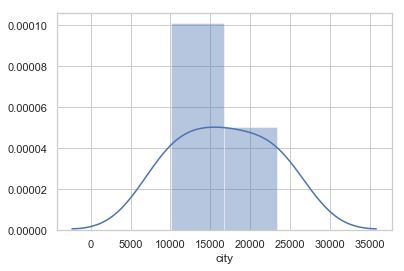

In [192]:
sns.distplot(ultimate_dataframe['city'].value_counts())

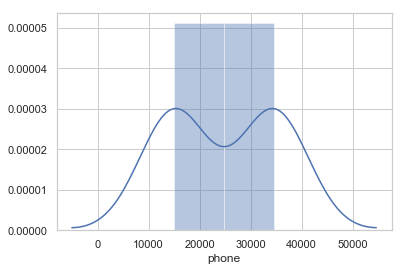

In [193]:
sns.distplot(ultimate_dataframe['phone'].value_counts())